# Understanding Noise in Text-to-Image Generation: An Explainable AI Perspective

## Overview and Motivation

**What role does noise play in AI image generation?** This is the central question we'll explore in this notebook.

Diffusion models have revolutionized image generation, but their inner workings remain somewhat mysterious. Unlike traditional generative models, diffusion models **learn to understand and manipulate noise** to create images. This raises fascinating questions from an **explainable AI (xAI)** perspective:

- **How does noise encode semantic information?** Can we interpret what the model "sees" in noise at different stages?
- **Which timesteps are most critical?** When does structure emerge from randomness?
- **How does conditioning affect noise prediction?** What happens to the noise when we guide generation with text?

### Our Approach

In this notebook, we combine two powerful technologies:

1. **Denoising Diffusion Probabilistic Models (DDPM)** - Models that learn to generate by predicting and removing noise
2. **CLIP (Contrastive Language-Image Pre-Training)** - A model that aligns text and image representations

But our focus goes beyond just building a text-to-image system. We aim to:

✨ **Understand the role of noise** in the generation process  
✨ **Interpret what the model learns** about noise at different timesteps  
✨ **Quantify the effect of guidance** on noise prediction  
✨ **Visualize the denoising trajectory** to make the "black box" more transparent

### What You'll Learn

By the end of this notebook, you'll understand:
- How diffusion models learn to predict noise (and why this enables generation)
- How CLIP embeddings condition noise prediction for text-guided generation
- **How to analyze and interpret the noise** at different stages of generation
- **How to quantify the importance** of different denoising steps
- How guidance strength affects the noise prediction process

### This Notebook's Focus

This notebook assumes you have already trained a CLIP-conditioned diffusion model. We will:
- Load a pretrained model checkpoint
- Perform detailed analysis of the noise patterns
- Visualize the denoising process
- Interpret how text guidance affects generation

For training a new model, please see `train_model.ipynb`.

## 1. Diffusion Models: Noise as a Generative Tool

Diffusion models represent a paradigm shift in how we think about image generation. Instead of directly generating pixels, they **learn to understand and manipulate noise**.

**The Central Insight**: If we can accurately predict what noise was added to an image, we can reverse the process—starting from pure noise and progressively removing it to create new images.

### 1.1 The Forward Diffusion Process: Systematically Adding Noise

The forward process gradually corrupts an image with Gaussian noise over $T$ timesteps. At each step $t$, we add noise controlled by a variance schedule $\beta_t$:

$$q(x_t | x_{t-1}) = \mathcal{N}(x_t; \sqrt{1-\beta_t}x_{t-1}, \beta_t I)$$

After many steps, the original image $x_0$ becomes indistinguishable from pure noise $x_T \sim \mathcal{N}(0, I)$. 

**Key property**: We can jump directly to any timestep without computing intermediate steps:

$$x_t = \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1-\bar{\alpha}_t} \epsilon$$

where $\alpha_t = 1 - \beta_t$, $\bar{\alpha}_t = \prod_{i=1}^{t} \alpha_i$, and $\epsilon \sim \mathcal{N}(0, I)$ is the noise.

**xAI Perspective**: This deterministic relationship means that for any noisy image $x_t$, there's a specific noise pattern $\epsilon$ that links it to the original $x_0$. The model's job is to **learn to recognize and predict these noise patterns**.

### 1.2 The Reverse Diffusion Process: Learning to Predict Noise

Here's where the magic happens. A neural network $\epsilon_\theta(x_t, t)$ learns to **predict the noise** $\epsilon$ that was added to create $x_t$ from $x_0$.

Why predict noise instead of the image directly?
- **Noise is more structured** than it appears—it encodes information about the image
- Predicting noise is **easier to learn** (stable gradients)
- The same noise predictor works **across all timesteps**

Once trained, we generate images by:
1. Starting with random noise $x_T \sim \mathcal{N}(0, I)$
2. Iteratively predicting and removing noise: 

$$x_{t-1} = \frac{1}{\sqrt{\alpha_t}}(x_t - \frac{1-\alpha_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon_\theta(x_t, t)) + \sigma_t z$$

where $z \sim \mathcal{N}(0, I)$ and $\sigma_t$ controls stochasticity.

**xAI Perspective**: Each denoising step removes a predicted noise pattern. By analyzing $\epsilon_\theta(x_t, t)$ at different timesteps, we can understand **when and how** semantic structure emerges.

### 1.3 Training Objective: Noise Prediction Error

The model is trained with a simple objective—minimize the difference between predicted and actual noise:

$$L = \mathbb{E}_{x_0, \epsilon, t} \left[ ||\epsilon - \epsilon_\theta(x_t, t)||^2 \right]$$

**xAI Perspective**: This loss tells us how well the model "understands" noise at each timestep. By analyzing this loss across timesteps and conditioning, we can identify:
- Which timesteps are hardest to denoise (largest errors)
- How conditioning changes noise prediction patterns
- What visual features emerge at different noise levels

**Key References:**
- [Denoising Diffusion Probabilistic Models (Ho et al., 2020)](https://arxiv.org/abs/2006.11239) - The foundational DDPM paper
- [Understanding Diffusion Models (Luo, 2022)](https://arxiv.org/abs/2208.11970) - Comprehensive mathematical overview

## 2. CLIP: Semantic Guidance Through Aligned Embeddings

[CLIP (Contrastive Language-Image Pre-Training)](https://arxiv.org/abs/2103.00020) by OpenAI learns to connect images and text in a shared embedding space. This alignment is crucial for understanding **how semantic information can guide noise prediction**.

### 2.1 How CLIP Works

CLIP consists of two encoders that map to the same 512-dimensional space:
- **Image Encoder**: Processes images → 512D embeddings
- **Text Encoder**: Processes text → 512D embeddings

The key training objective is **contrastive learning**: maximize similarity between correct (image, text) pairs while minimizing similarity with incorrect pairs.

**Result**: Images and their textual descriptions end up close together in embedding space.

### 2.2 Why CLIP Matters for Noise Prediction

CLIP provides a way to **condition noise prediction** on semantic content:

1. **Semantic Alignment**: CLIP embeddings capture semantic meaning—similar concepts have similar embeddings
2. **Continuous Conditioning**: Unlike discrete labels, CLIP embeddings form a continuous space
3. **Natural Language Interface**: Users can describe desired content in plain English

**xAI Perspective**: By conditioning the noise predictor $\epsilon_\theta(x_t, t, c)$ on CLIP embedding $c$, we can ask:
- **How does the model's noise prediction change** when we add text conditioning?
- **What semantic information is encoded** in the noise at different timesteps?
- **Can we visualize the effect** of different prompts on noise patterns?

### 2.3 CLIP in Our Pipeline

We use CLIP for text-to-image generation:
1. **During Training**: Extract CLIP image embeddings to teach the model what noise patterns correspond to different semantic content
2. **During Generation**: Encode text prompts to guide noise prediction toward desired content

**Key Insight for xAI**: Because CLIP aligns text and images, we can train on image embeddings but test with text embeddings—allowing us to study how linguistic concepts influence noise prediction.

**Key References:**
- [Learning Transferable Visual Models From Natural Language Supervision (Radford et al., 2021)](https://arxiv.org/abs/2103.00020) - The original CLIP paper
- [CLIP GitHub Repository](https://github.com/openai/CLIP) - Official implementation and pre-trained models

## 3. Classifier-Free Guidance: Amplifying Semantic Signal in Noise

Now we address a critical question: **How can we strengthen the influence of text conditioning on noise prediction?**

### 3.1 Conditioning the U-Net on CLIP Embeddings

Our diffusion model uses a U-Net architecture to predict noise, now conditioned on CLIP embeddings:

```python
epsilon = UNet(x_t, t, c)  # Predict noise given image, timestep, and CLIP embedding
```

where:
- `x_t` is the noisy image at timestep t
- `t` is the timestep embedding
- `c` is the CLIP embedding (512-dimensional vector)

The CLIP embedding is incorporated through **scale and shift** operations ([FiLM layers](https://arxiv.org/abs/1709.07871)):

```python
up1 = self.up1(c_emb1 * up0 + t_emb1, down2)  # Modulate features with CLIP
```

**xAI Perspective**: The scale and shift operations allow CLIP embeddings to **modulate the noise prediction** at different feature scales. We can analyze how different text prompts change these modulations.

### 3.2 Classifier-Free Guidance: A Key Technique for Interpretability

During training, we randomly drop CLIP conditioning (set `c = 0`) with ~10% probability. This teaches the model two modes:
- **Conditional**: Predict noise for a specific CLIP embedding
- **Unconditional**: Predict "average" noise without guidance

During generation, we use **classifier-free guidance** ([Ho & Salimans, 2022](https://arxiv.org/abs/2207.12598)):

$$\tilde{\epsilon}_\theta(x_t, c) = (1 + w) \cdot \epsilon_\theta(x_t, c) - w \cdot \epsilon_\theta(x_t, \emptyset)$$

where:
- $\epsilon_\theta(x_t, c)$ is the **conditional** noise prediction (with text guidance)
- $\epsilon_\theta(x_t, \emptyset)$ is the **unconditional** noise prediction (without guidance)
- $w$ is the guidance weight (typically 1-2)

**Interpreting the Formula**:
- The model predicts noise **twice** at each step
- We take the conditional prediction and **push it away** from the unconditional baseline
- This amplifies the effect of the text prompt on noise prediction
- When $w = 0$: Standard conditional generation
- When $w > 0$: Stronger adherence to the text prompt

**xAI Perspective**: This formulation is powerful for interpretability because:
1. **We can visualize the difference** $\Delta\epsilon = \epsilon_\theta(x_t, c) - \epsilon_\theta(x_t, \emptyset)$ to see how text changes noise prediction
2. **We can sweep $w$ values** to quantify how guidance strength affects generation
3. **We can analyze when conditioning matters most** by comparing conditional vs unconditional predictions across timesteps

**Key References:**
- [Classifier-Free Diffusion Guidance (Ho & Salimans, 2022)](https://arxiv.org/abs/2207.12598)
- [High-Resolution Image Synthesis with Latent Diffusion Models (Rombach et al., 2022)](https://arxiv.org/abs/2112.10752) - Stable Diffusion

---

## 4. Loading Pretrained Model and Setup

Now let's load a pretrained CLIP-conditioned diffusion model and explore its behavior. This notebook focuses on **analysis and interpretation** rather than training.

### 4.1 Initial Setup and Libraries

In [1]:
import os
import sys
import random
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.utils import save_image, make_grid
from textwrap import wrap

from ddpm_clip.models import UNet, DDPM, sample_w, EMA
from ddpm_clip.models.analysis import visualize_diffusion_process
from ddpm_clip.utils import (
    save_animation, 
    generation_image, 
    to_image, 
    load_config,
    sample_from_text,
    load_checkpoint
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
assert device.type == 'cuda', "CPU not supported, please run on a machine with CUDA"
print(f"Using device: {device}")

Using device: cuda


In [2]:
# OPTIONAL: Set new HOME directory to scratch space for Das6
import getpass

current_user = getpass.getuser()
if current_user == 'ciarella':
    new_home = '/var/scratch/ciarella/xAI'
    os.environ['HOME'] = new_home
    os.makedirs(new_home, exist_ok=True)
    print(f"Changed HOME directory to: {os.environ['HOME']}")
else:
    print(f"Running as user '{current_user}' - using default HOME directory: {os.environ['HOME']}")

Running as user 'sciarella' - using default HOME directory: /home/sciarella


### 4.2 Load Configuration and CLIP Model

In [3]:
# Load configuration - MODIFY THIS PATH to point to your trained model's config
config = load_config('../config/model_small.yaml')
config = load_config('../config/model_default.yaml')
config = load_config('../config/test.yaml')

print(f"Loaded configuration for model: {config.model_name}")
print(f"\nModel architecture:")
print(f"  Down channels: {config['model']['down_channels']}")
print(f"  Image size: {config['model']['img_size']}")
print(f"  Diffusion timesteps: {config['diffusion']['timesteps']}")
print(f"\nCheckpoint directory: {config.checkpoint_dir}")

Loaded configuration for model: test_ddpm_small

Model architecture:
  Down channels: [128, 256, 512]
  Image size: 32
  Diffusion timesteps: 300

Checkpoint directory: ../model_checkpoint/test_ddpm_small


In [4]:
import clip
import gc

gc.collect()
torch.cuda.empty_cache()

clip_model, clip_preprocess = clip.load("ViT-B/32")
clip_model.eval()
CLIP_FEATURES = 512
print(f"CLIP model loaded with {CLIP_FEATURES} features")

CLIP model loaded with 512 features


### 4.3 Understanding CLIP Encodings

Let's explore how CLIP encodes images and text into the same embedding space.

#### 4.3.1 Image Encodings

In [5]:
# Display CLIP's preprocessing pipeline
clip_preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x14b12bec3940>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

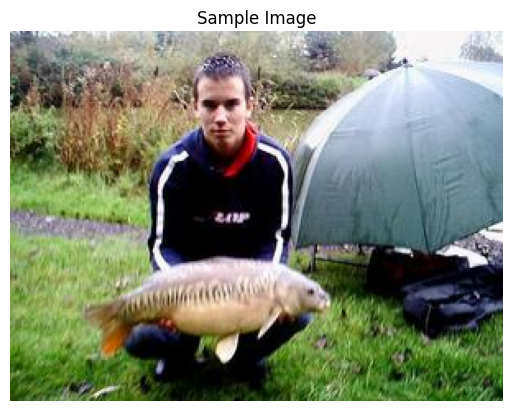

In [6]:
# Load and encode a sample image
DATA_DIR = "../data/tiny-imagenet-200/train/n01917289/images/"
img_path = DATA_DIR + "n01917289_241.JPEG"
DATA_DIR = "/projects/prjs1711/XAI4SFM/ImageNet1k_resized/test/00000/"
img_path = DATA_DIR + "501713769930527.jpg"
img = Image.open(img_path)
plt.imshow(img)
plt.axis('off')
plt.title("Sample Image")
plt.show()

In [7]:
clip_imgs = torch.tensor(np.stack([clip_preprocess(img)])).to(device)
clip_img_encoding = clip_model.encode_image(clip_imgs)
print(f"Image encoding shape: {clip_img_encoding.size()}")
print(f"Each image is now represented as a point in {CLIP_FEATURES}-dimensional space!")

Image encoding shape: torch.Size([1, 512])
Each image is now represented as a point in 512-dimensional space!


#### 4.3.2 Text Encodings

In [8]:
text_list = [
    "A lush green forest",
    "An emotional sunset",
    "A concert in a theater"
]
text_tokens = clip.tokenize(text_list).to(device)
clip_text_encodings = clip_model.encode_text(text_tokens).float()
print(f"Text encodings shape: {clip_text_encodings.size()}")

Text encodings shape: torch.Size([3, 512])


#### 4.3.3 Measuring Similarity with Cosine Distance

In [9]:
# Normalize and compute similarity
clip_img_encoding /= clip_img_encoding.norm(dim=-1, keepdim=True)
clip_text_encodings /= clip_text_encodings.norm(dim=-1, keepdim=True)
similarity = (clip_text_encodings * clip_img_encoding).sum(-1)
print("Similarity scores between image and texts:")
for i, text in enumerate(text_list):
    print(f"  '{text}': {similarity[i]:.3f}")

Similarity scores between image and texts:
  'A lush green forest': 0.153
  'An emotional sunset': 0.138
  'A concert in a theater': 0.135


### 4.4 Initialize Model Architecture

In [10]:
# Model parameters from config
IMG_CH = config['model']['img_channels']
IMG_SIZE = config['model']['img_size']
INPUT_SIZE = (IMG_CH, IMG_SIZE, IMG_SIZE)

# Diffusion parameters
T = config['diffusion']['timesteps']
B_start = config['diffusion']['beta_start']
B_end = config['diffusion']['beta_end']
B = torch.linspace(B_start, B_end, T).to(device)

ddpm = DDPM(B, device)

# Initialize model architecture
model = UNet(
    T, IMG_CH, IMG_SIZE,
    down_chs=tuple(config['model']['down_channels']),
    t_embed_dim=config['model']['t_embed_dim'],
    c_embed_dim=config['model']['c_embed_dim']
)
print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

torch.set_float32_matmul_precision('high')
model = model.to(device)
print("Model architecture initialized")

Model parameters: 41,171,715
Model architecture initialized


### 4.5 Load Pretrained Checkpoint

In [11]:
# Create EMA object for loading if available
use_ema = config['training']['ema']['enabled']
if use_ema:
    ema = EMA(model, decay=config['training']['ema']['decay'])
else:
    ema = None

# Load checkpoint using the utility function from the package
checkpoint_epoch, loss_history = load_checkpoint(
    config=config,
    model=model,
    ema=ema
)

# If checkpoint was loaded, display info
if checkpoint_epoch > 0:
    print(f"\nModel loaded from epoch {checkpoint_epoch}")
    if loss_history:
        print(f"Training history:")
        print(f"  Final loss: {loss_history[-1]:.6f}")
        print(f"  Trained for {checkpoint_epoch} epochs")
    
    # Apply EMA weights if available
    if use_ema and ema is not None:
        print("Using EMA weights for generation")
        ema.apply_shadow()
    else:
        print("Using standard model weights (no EMA)")
else:
    raise FileNotFoundError(f"No checkpoint files found in {config.checkpoint_dir}. Please train a model first using train_model.ipynb")

model.eval()
print("\nModel loaded successfully and ready for generation!")


Found checkpoint: ../model_checkpoint/test_ddpm_small/0.pth
Automatically resuming training...
Resumed from epoch 1 with 1 loss values

Model loaded from epoch 1
Training history:
  Final loss: 0.121783
  Trained for 1 epochs
Using EMA weights for generation

Model loaded successfully and ready for generation!


### 4.6 Visualize Training Loss (if available)

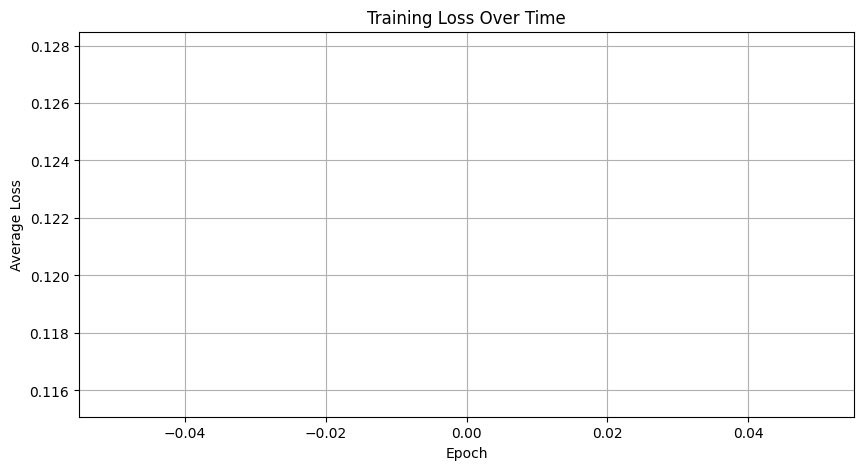

Lowest loss: 0.121783 at epoch 0


In [12]:
if loss_history and len(loss_history) > 0:
    plt.figure(figsize=(10, 5))
    plt.plot(range(len(loss_history)), loss_history)
    plt.xlabel('Epoch')
    plt.ylabel('Average Loss')
    plt.title('Training Loss Over Time')
    plt.grid(True)
    plt.show()
    
    print(f"Lowest loss: {min(loss_history):.6f} at epoch {np.argmin(loss_history)}")
else:
    print("No loss history available in checkpoint")

---

## 5. Explainable AI Analysis: Interpreting the Role of Noise

Now we apply xAI techniques to understand **how noise encodes semantic information** and **which denoising steps matter most**.

### 5.1 Visualizing the Denoising Trajectory

The `visualize_diffusion_process` function reveals the step-by-step transformation from noise to image.

**What We Can Learn**:

1. **When does semantic structure emerge?**
   - Early timesteps (high noise): Global structure and composition
   - Middle timesteps: Object shapes and boundaries
   - Late timesteps (low noise): Fine details and textures

2. **How does guidance weight affect noise interpretation?**
   - Compare noise predictions at different `w` values
   - Observe how stronger guidance changes the trajectory

3. **Which timesteps are most critical?**
   - Identify the `top_k` steps with largest changes
   - These are where the model makes key "decisions" about content

Showing timesteps: [0, 42, 85, 128, 170, 213, 256, 299]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0623007..2.4591584].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.05331..2.486299].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.4373288..2.4630702].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.4576142..2.4749122].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2897527..2.1716208].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.287771..2.15763].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.098095..2.18

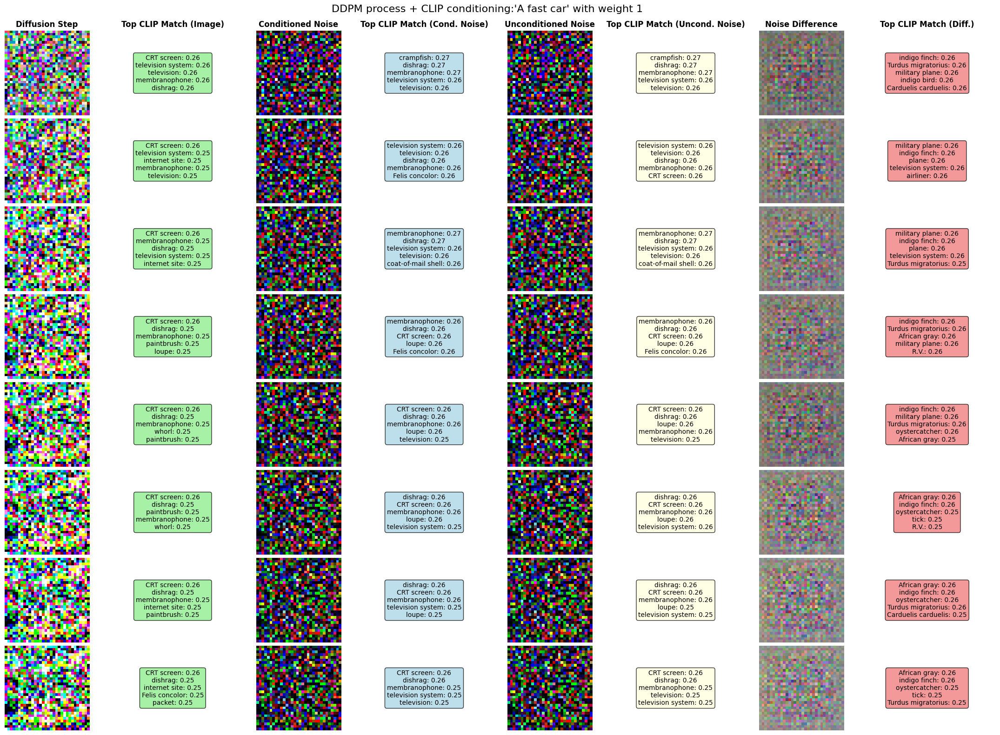

In [13]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')

# Test the diffusion visualization function
visualize_diffusion_process(
    ddpm=ddpm,
    model=model,
    clip_model=clip_model,
    clip_preprocess=clip_preprocess,
    embed_size=CLIP_FEATURES,
    device=device,
    img_ch=IMG_CH,
    img_size=IMG_SIZE,
    timesteps_to_show=None,
    prompt="A fast car",
    w=1,
    top_k=5,
    #vocabulary='tinyimagenet'
    vocabulary='imagenet1k'
);

### 5.2 Quantifying the Effect of Guidance Weight

Now we systematically test how guidance strength affects generation. The model generates images at **multiple guidance weights** simultaneously.

**What Different Weights Mean**:

| Weight | Effect | Use Case |
|--------|--------|----------|
| w < 0 | Pushes **toward** unconditional (more random) | Exploring model's "imagination" |
| w = 0 | Standard conditional generation | Balanced generation |
| w = 1 | Moderate guidance | Good quality-diversity tradeoff |
| w = 2 | Strong guidance | High fidelity to prompt |
| w > 2 | Very strong guidance | May reduce diversity/naturalness |

**xAI Analysis Questions**:
- At what `w` do images best match the prompt?
- Is there a "sweet spot" for your use case?
- How does quality degrade with extreme `w` values?
- Can you identify visual artifacts from over-guidance?

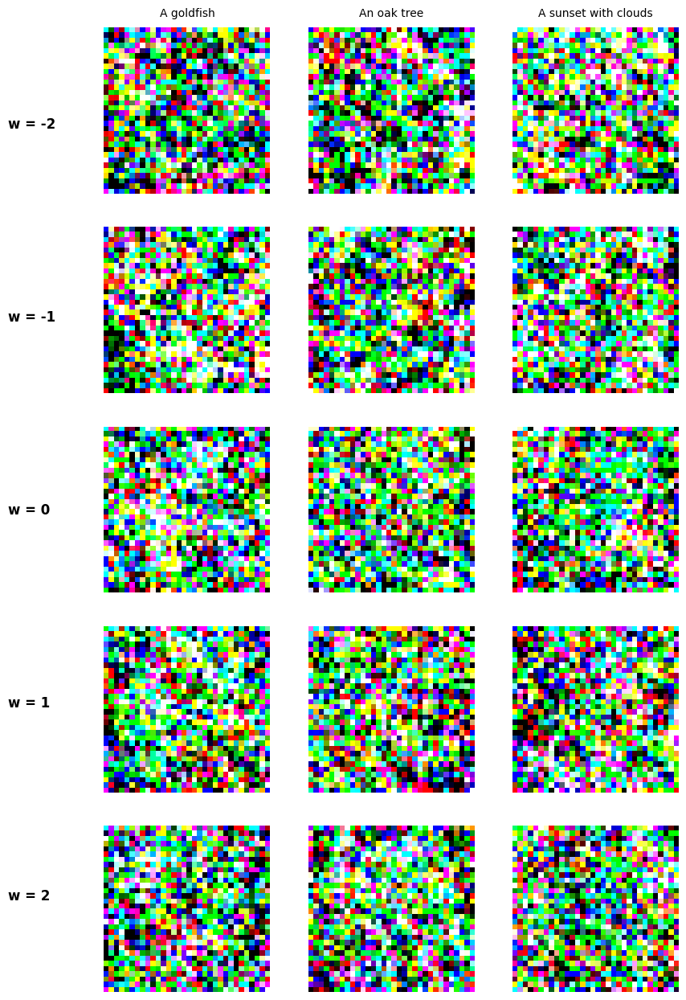

In [14]:
# Generate images with different guidance weights
text_list = [
    "A goldfish",
    "An oak tree",
    "A sunset with clouds"
]

w_values = [-2, -1, 0, 1, 2]

x_gen, x_gen_store = sample_from_text(
    text_list=text_list,
    clip_model=clip_model,
    model=model,
    ddpm=ddpm,
    input_size=INPUT_SIZE,
    timesteps=T,
    device=device,
    w_values=w_values
)

# Display results
fig = generation_image(x_gen, text_list, w=w_values)
display(fig)

### 5.3 Animating the Noise-to-Image Transformation

Create animations showing the complete denoising trajectory. This visualization is crucial for understanding:

**What the Animation Reveals**:
1. **Noise structure evolution**: Watch how random noise develops semantic meaning
2. **Critical timesteps**: Identify when major structural decisions are made
3. **Guidance effects**: See how different `w` values change the path through noise space

**xAI Value**: The animation makes the entire generation process transparent, showing that images emerge gradually through learned noise removal, not "magic."

In [15]:
# Generate frames for animation
grids = [generation_image(x_gen.cpu(), text_list, w=w_values) for x_gen in x_gen_store]
animation_path = "../images/analysis_generation.gif"
save_animation(grids, animation_path)
print(f"Animation saved to {animation_path}")

Animation saved to: ../images/analysis_generation.gif
Animation saved to ../images/analysis_generation.gif


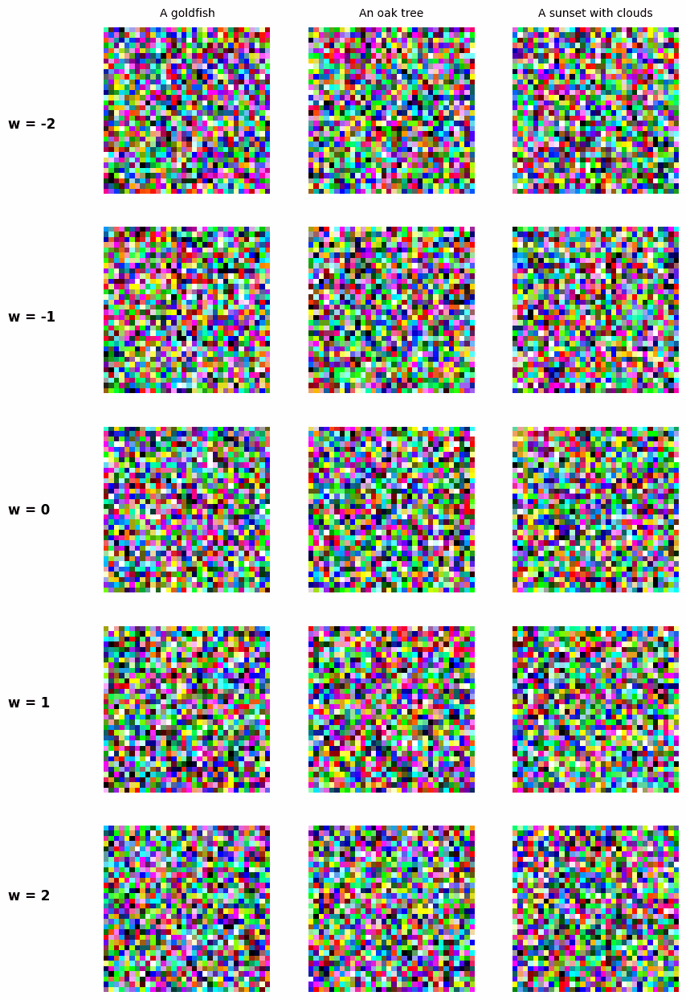

In [16]:
from IPython.display import Image as IPImage, display
display(IPImage(filename=animation_path))

---

## 6. Conclusions: What We Learned About Noise

### The Central Finding: Noise is Structured and Interpretable

Through this notebook, we've demonstrated that **noise in diffusion models is not random** in the traditional sense. Instead:

**Key Insights from Our Analysis**:

1. **Noise Encodes Semantic Information**
   - The model learns that different noise patterns correspond to different visual content
   - CLIP conditioning changes these patterns in interpretable ways
   - We can visualize and quantify these changes through classifier-free guidance

2. **Timesteps Have Different Roles**
   - Early timesteps: Establish global structure (composition, layout)
   - Middle timesteps: Define semantic content (what objects are present)
   - Late timesteps: Refine details (texture, edges)
   - Our `top_k` analysis identifies which steps are most critical

3. **Guidance Weight Controls Semantic Strength**
   - $w$ acts as a "confidence" parameter for text conditioning
   - The difference $\Delta\epsilon = \epsilon_\theta(x_t, c) - \epsilon_\theta(x_t, \emptyset)$ quantifies semantic signal
   - We can tune $w$ based on desired quality-diversity tradeoff

### Explainable AI Contributions

This notebook demonstrates several xAI techniques for diffusion models:

✅ **Visualization**: Making the denoising process observable through animations  
✅ **Quantification**: Measuring the effect of guidance on noise prediction  
✅ **Interpretation**: Understanding when and how semantic structure emerges  
✅ **Comparison**: Analyzing conditional vs unconditional noise patterns  

**The Big Picture**: Diffusion models work by learning structured noise patterns. By understanding these patterns, we can:
- Diagnose when and why generation fails
- Optimize guidance parameters for specific use cases
- Develop better architectures that separate different noise components

### Future Directions

1. **Noise Pattern Analysis**
   - Cluster and categorize learned noise patterns
   - Identify which patterns correspond to which visual features
   - Develop metrics for "noise interpretability"

2. **Timestep Attribution**
   - Quantify the contribution of each timestep to final quality
   - Develop adaptive sampling strategies based on importance
   - Create "counterfactual" generations by modifying key timesteps

3. **Conditioning Mechanisms**
   - Compare different ways of incorporating CLIP embeddings
   - Analyze which U-Net layers are most affected by conditioning
   - Study how different guidance formulations change noise prediction

### Related Work and Resources

**Diffusion Models**:
- [Denoising Diffusion Probabilistic Models (Ho et al., 2020)](https://arxiv.org/abs/2006.11239) - Foundational DDPM paper
- [Understanding Diffusion Models (Luo, 2022)](https://arxiv.org/abs/2208.11970) - Mathematical overview

**Text-to-Image Systems**:
- [Stable Diffusion (Rombach et al., 2022)](https://arxiv.org/abs/2112.10752) - Latent diffusion for high-resolution generation
- [DALL-E 2 (Ramesh et al., 2022)](https://arxiv.org/abs/2204.06125) - OpenAI's text-to-image system
- [Imagen (Saharia et al., 2022)](https://arxiv.org/abs/2205.11487) - Google's approach using T5

**Explainability**:
- [Classifier-Free Diffusion Guidance (Ho & Salimans, 2022)](https://arxiv.org/abs/2207.12598) - The guidance technique we analyzed
- [Diffusion Models Tutorial (Hugging Face)](https://huggingface.co/blog/annotated-diffusion) - Practical implementation guide